<a href="https://colab.research.google.com/github/CarlosModinez/brazilian_weeds/blob/main/mixed_ds_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install -U segmentation-models-pytorch
!pip install  --force-reinstall albumentations 1.4.0

!pip uninstall pretrainedmodels -y
!pip uninstall efficientnet-pytorch -y
!pip uninstall timm -y

!pip install timm==0.9.12
!pip install pretrainedmodels>=0.7.4
!pip install efficientnet-pytorch>=0.7.1
!pip install torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 11.7 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_6

In [ ]:
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

import numpy as np
import os
import cv2

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.utils.data import Dataset

import segmentation_models_pytorch as smp
import segmentation_models_pytorch.utils
import albumentations as albu
import torchmetrics
from torchmetrics.classification import MulticlassJaccardIndex
from albumentations.pytorch import ToTensorV2
from matplotlib.colors import LinearSegmentedColormap

In [ ]:
colors = [
    (0,0,0),                        # background
    (155/255, 210/255, 10/255),     # corns
    (255/255, 111/255, 97/255),     # Amaranthus hybridos
    (255/255, 215/255, 0/255),      # Cyclospermum leptophyllum
    (64/255, 224/255, 208/255),     # Tridax procumbens
    (147/255, 112/255, 219/255),    # Sonchus oleraceus
    (0/255, 255/255, 0/255),        # Bidens-pilosa
    (255/255, 69/255, 0/255),       # Lelidium virginum
    (135/255, 206/255, 235/255),    # Ipomoeae purpurea
    (138/255, 43/255, 226/255),     # Leonurus sibiricus
    (255/255, 20/255, 147/255),     # Sorghum arundinaceum
    (50/255, 205/255, 50/255),      # Rhynchelytrumrepens
    (186/255, 85/255, 211/255),     # Digitaria insularis
    (255/255, 99/255, 71/255),      # Choris barbata
    (0/255, 206/255, 209/255),      # Cenchus echinatus
    (139/255, 69/255, 19/255)       # Physalis angulata
]

# Define positions
positions = np.linspace(0, 1, len(colors))

# Create colormap
cmap = LinearSegmentedColormap.from_list('CustomCmap', list(zip(positions, colors)))

def convert_visualizable_mask(mask):
    combined_mask = np.zeros((mask.shape[1], mask.shape[2]))
    for channel in range(mask.shape[0]):
        combined_mask[mask[channel, :, :] == 1] = channel

    return combined_mask

In [ ]:
DATASET_PATH = 'drive/My Drive/TCC/cropped_corn_weeds'
TRAIN_DATASET_PATH = os.path.join(DATASET_PATH, 'train')
BLENDER_DATASET_PATH = 'drive/My Drive/TCC/cropped_blender_digital_twin'
TEST_DATASET_PATH = os.path.join(DATASET_PATH, 'test')
VAL_DATASET_PATH = os.path.join(DATASET_PATH, 'validation')

In [ ]:
print(f"Train set: {len(os.listdir(os.path.join(TRAIN_DATASET_PATH, 'images')))} samples")
print(f"Blender set: {len(os.listdir(os.path.join(BLENDER_DATASET_PATH, 'images')))} samples")
print(f"Test set: {len(os.listdir(os.path.join(TEST_DATASET_PATH, 'images')))} samples")
print(f"Validation set: {len(os.listdir(os.path.join(VAL_DATASET_PATH, 'images')))} samples")

Train set: 17476 samples
Blender set: 18000 samples
Test set: 3846 samples
Validation set: 3754 samples


In [ ]:
class CornWeedsDataset(Dataset):
    CLASSES = [
        "background", "corns", "amaranthus hybridos", "cyclospermum leptophyllum", "tridax procumbens",
        "sonchus oleraceus", "bidens-pilosa", "lelidium virginum", "ipomoeae purpurea",
        "leonurus sibiricus", "sorghum arundinaceum", "rhynchelytrumrepens", "digitaria insularis",
        "choris barbata", "cenchus echinatus", "physalis angulata"
    ]

    def __init__(
        self,
        images_dir,
        blender_dir=None,
        annotations_dir=None,
        blender_annot_dir=None,
        classes=None,
        preprocessing=None,
        transform=None
  ):
        self.ids = os.listdir(images_dir)
        self.images = [os.path.join(images_dir, image_id) for image_id in self.ids]
        self.annotations = [os.path.join(annotations_dir, image_id) for image_id in self.ids]

        if blender_dir:
          self.blender_ids = os.listdir(blender_dir)
          self.images.extend([os.path.join(blender_dir, image_id) for image_id in self.blender_ids])
          self.annotations.extend([os.path.join(blender_annot_dir, image_id) for image_id in self.blender_ids])
          self.ids.extend(self.blender_ids)

        self.preprocessing = preprocessing
        self.transform = transform
        self.images.sort()
        self.annotations.sort()

        if classes:
            self.class_values = [self.CLASSES.index(cls.lower()) for cls in classes]
        else:
            self.class_values = np.arange(0, len(CornWeedsDataset.CLASSES))

    def __getitem__(self, i):
        image = cv2.imread(self.images[i])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.annotations[i], cv2.IMREAD_GRAYSCALE)

        if self.transform is not None:
            sample = self.transform(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']

        return image, mask

    def __len__(self):
        return len(self.images)

In [ ]:
test_transform = albu.Compose([
    albu.PadIfNeeded(min_height=256, min_width=256, border_mode=4),
    albu.Resize(256, 256),
    ToTensorV2(),
])

train_transform = albu.Compose([
    albu.PadIfNeeded(min_height=256, min_width=256, border_mode=4),
    albu.Resize(256, 256),
    albu.RandomBrightnessContrast(),
    albu.HorizontalFlip(p=0.5),
    albu.VerticalFlip(p=0.5),
    albu.MedianBlur(blur_limit=3, p=0.1, always_apply=False),
    ToTensorV2(),
])

def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')

def get_preprocessing(preprocessing_fn):
    _transform = [
        albu.Lambda(image=preprocessing_fn),
        albu.Lambda(image=to_tensor, mask=to_tensor),
    ]
    return albu.Compose(_transform)

In [ ]:
ENCODER = 'resnet152'
ENCODER_WEIGHTS = 'imagenet'

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

train_dataset = CornWeedsDataset(
    os.path.join(TRAIN_DATASET_PATH, 'images'),
    os.path.join(BLENDER_DATASET_PATH, 'images'),
    os.path.join(TRAIN_DATASET_PATH, 'annotations'),
    os.path.join(BLENDER_DATASET_PATH, 'annotations'),
    classes=None,
    preprocessing=get_preprocessing(preprocessing_fn),
    transform=train_transform
)

val_dataset = CornWeedsDataset(
    os.path.join(VAL_DATASET_PATH, 'images'),
    blender_dir=None,
    annotations_dir=os.path.join(VAL_DATASET_PATH, 'annotations'),
    blender_annot_dir=None,
    classes=None,
    preprocessing=get_preprocessing(preprocessing_fn),
    transform=test_transform
)

test_dataset = CornWeedsDataset(
    os.path.join(TEST_DATASET_PATH, 'images'),
    blender_dir=None,
    annotations_dir=os.path.join(TEST_DATASET_PATH, 'annotations'),
    blender_annot_dir=None,
    classes=None,
    preprocessing=get_preprocessing(preprocessing_fn),
    transform=test_transform
)

n_workers = os.cpu_count()
batch_size = 8

train_data_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size,
                                                shuffle=True, num_workers=n_workers)

val_data_loader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size,
                                              shuffle=False, num_workers=n_workers)

test_data_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size,
                                               shuffle=False, num_workers=n_workers)

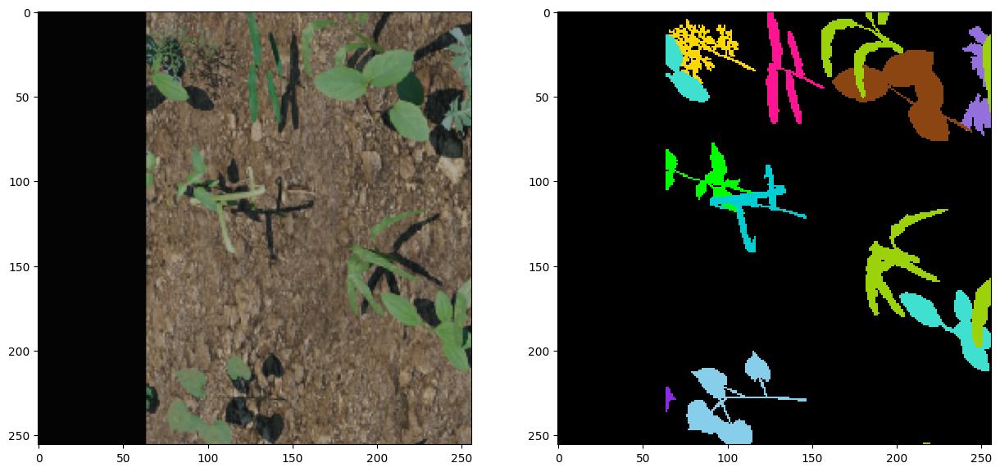

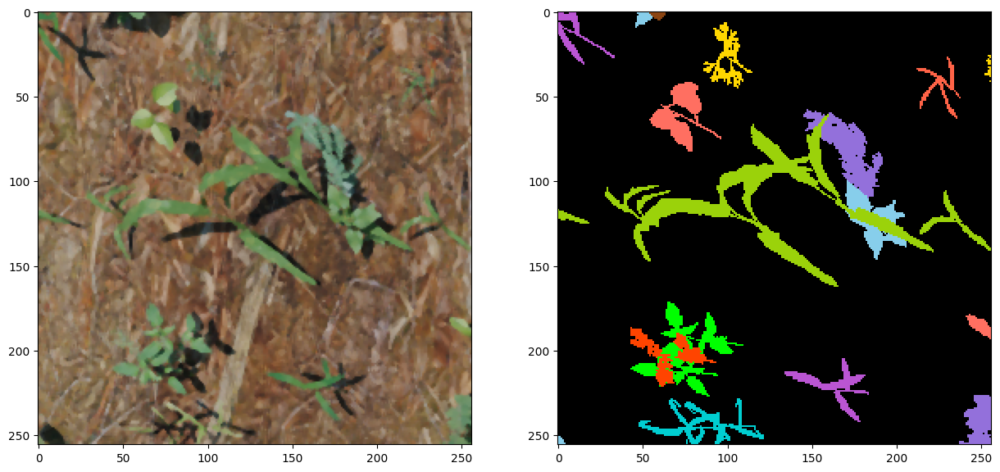

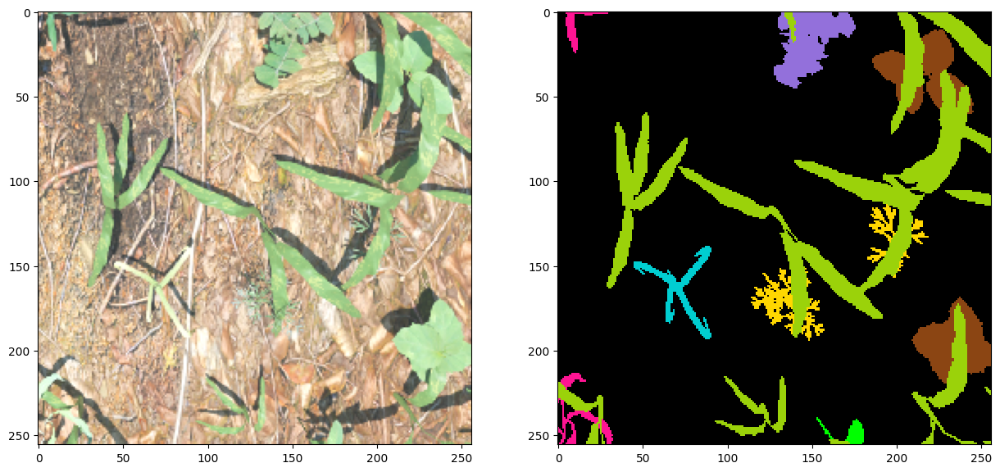

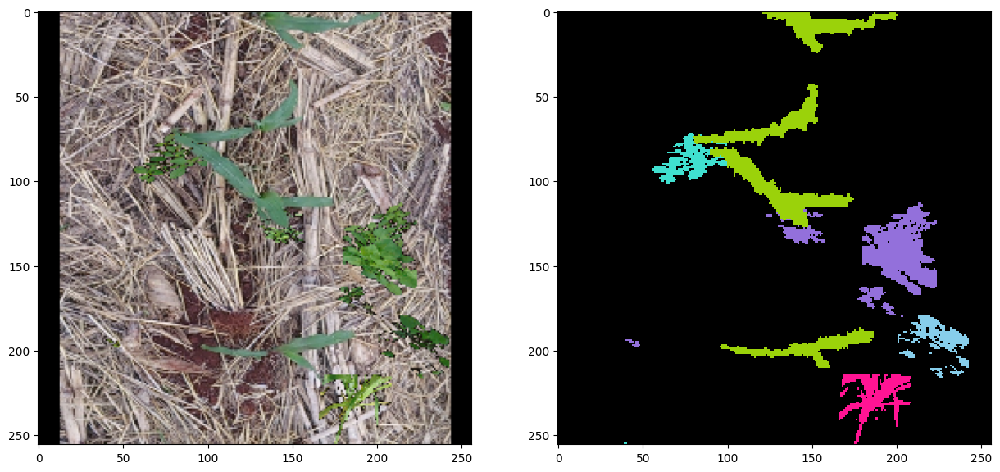

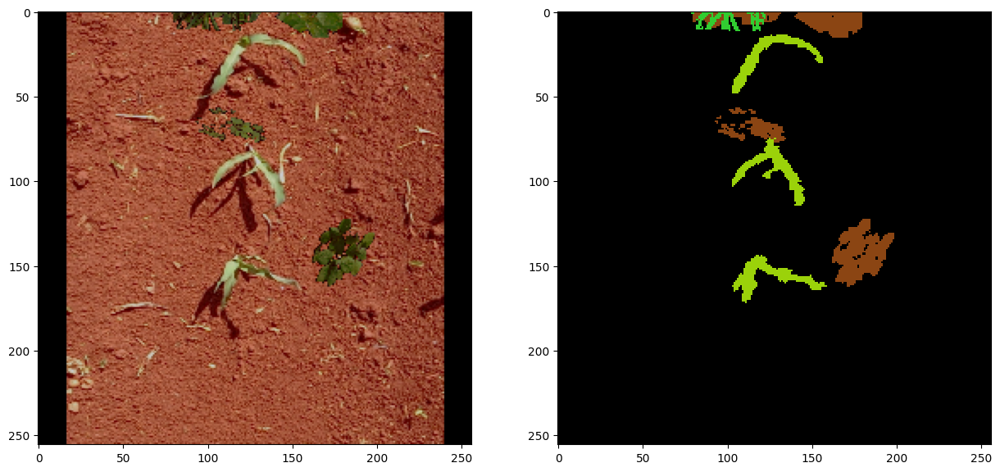

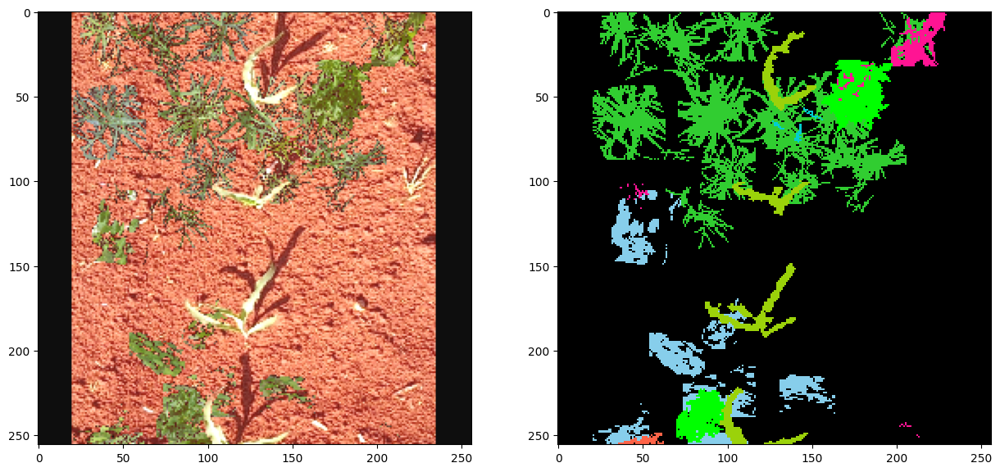

In [ ]:
class UnNormalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        for t, m, s in zip(tensor, self.mean, self.std):
            t.mul_(s).add_(m)
            # The normalize code -> t.sub_(m).div_(s)
        return tensor

unorm = UnNormalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
for i in range(0, len(train_dataset), int(len(train_dataset)/5)):
    img, mask = train_dataset[i]
    #print(f'image: {img.shape} - mask: {mask.shape}')

    _, axis = plt.subplots(1,2, figsize=(15,20))
    axis[0].imshow(img.permute(1,2,0))
    axis[1].imshow(mask, cmap=cmap, vmin=0, vmax=len(colors)-1, interpolation='nearest')

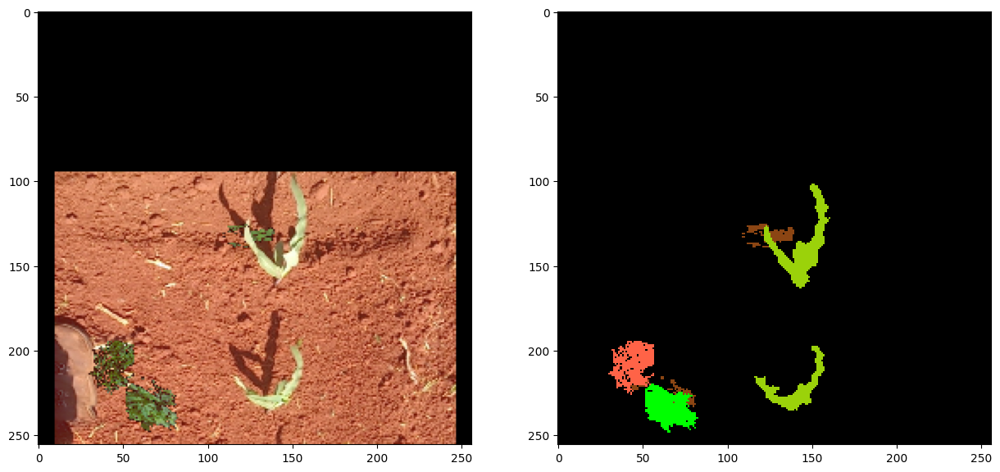

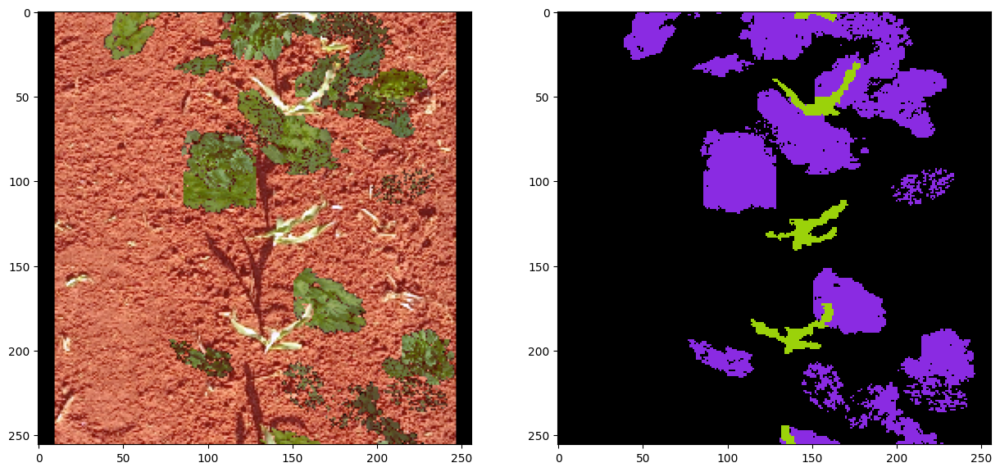

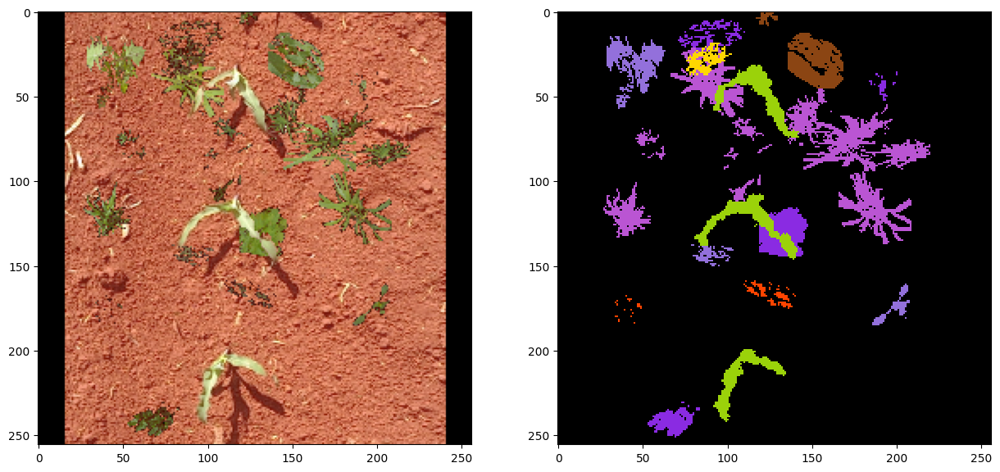

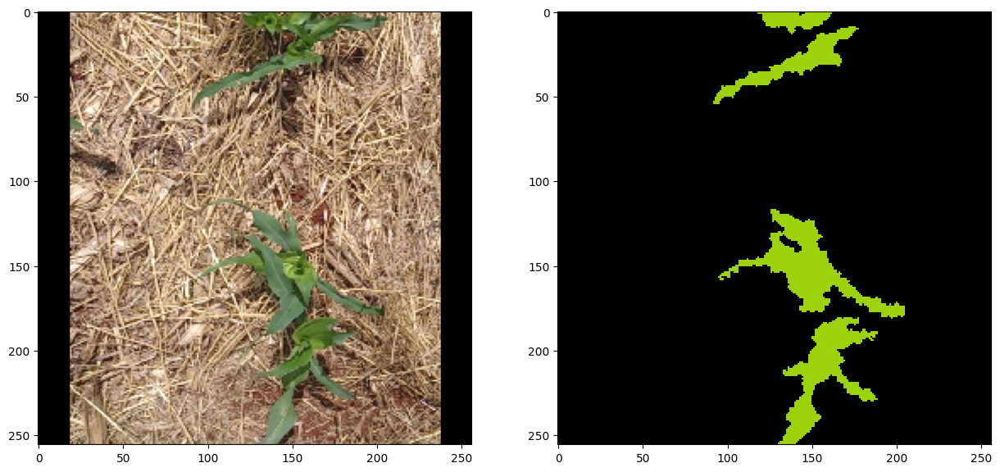

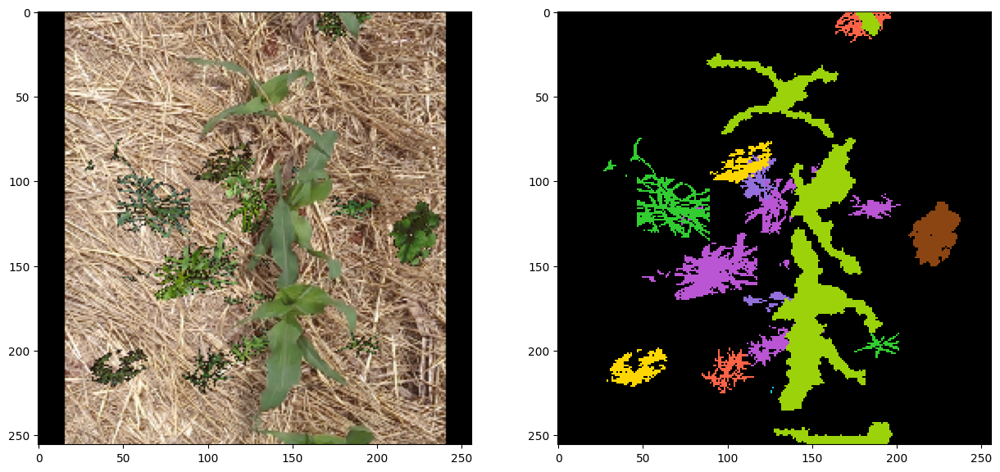

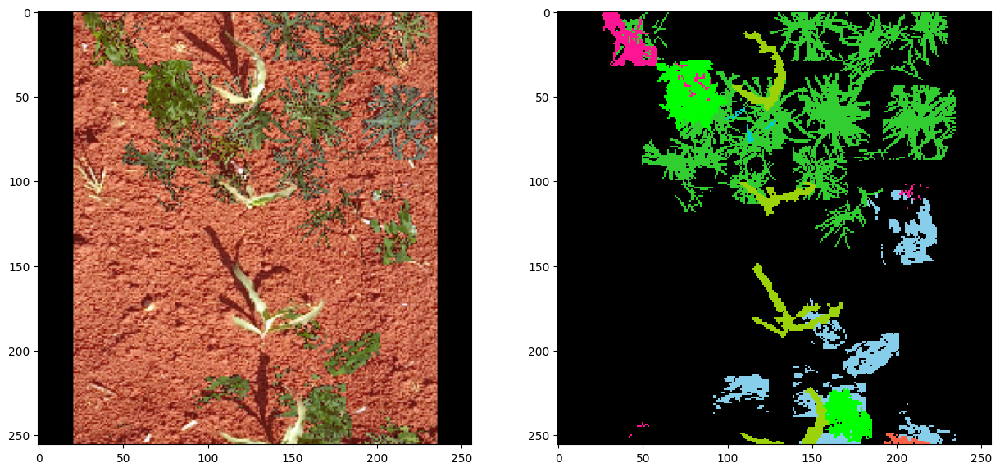

In [ ]:
for i in range(0, len(test_dataset), int(len(test_dataset)/5)):
    img, mask = test_dataset[i]

    _, axis = plt.subplots(1,2, figsize=(15,20))
    axis[0].imshow(img.permute(1,2,0))
    axis[1].imshow(mask, cmap=cmap, vmin=0, vmax=len(colors)-1, interpolation='nearest')

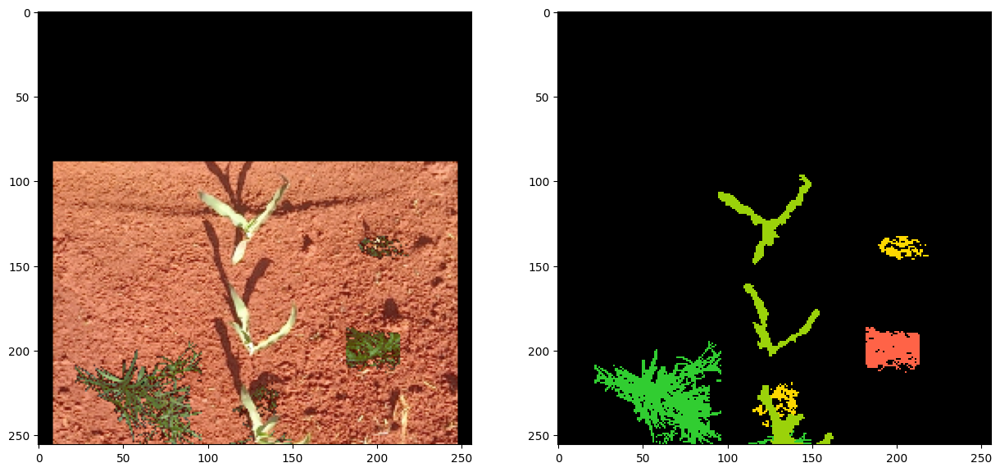

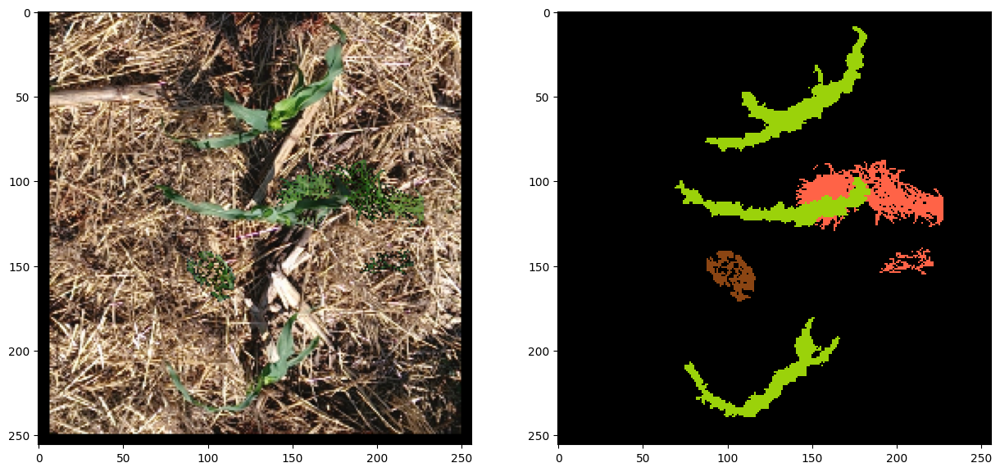

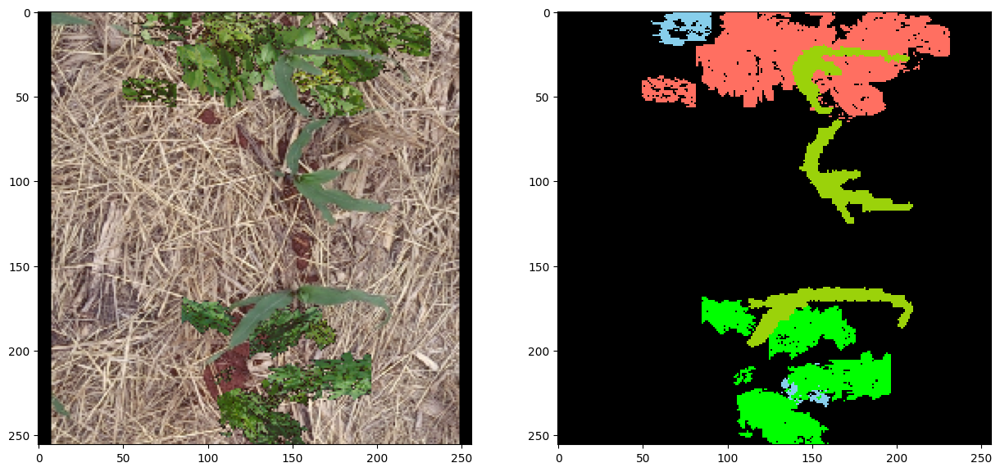

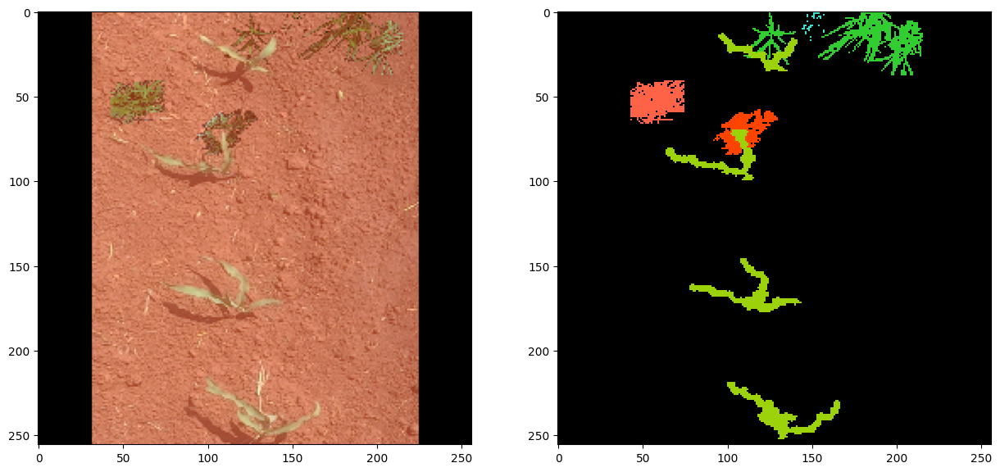

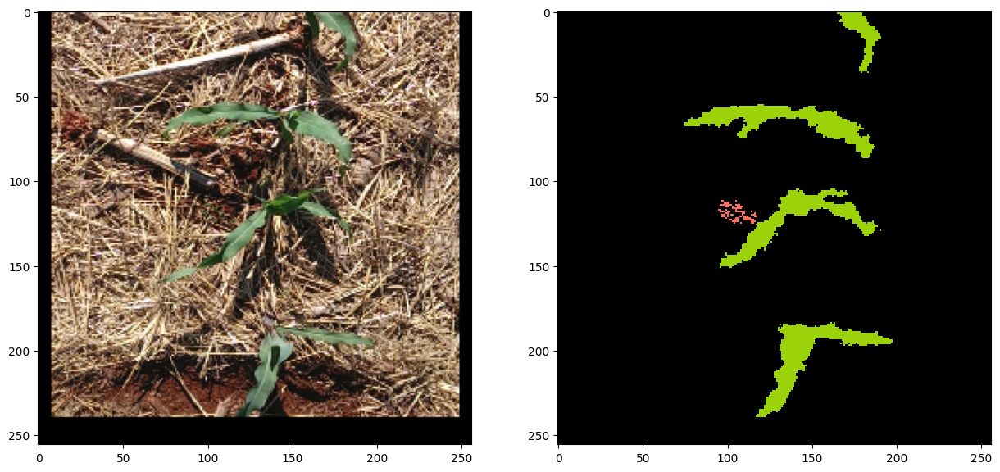

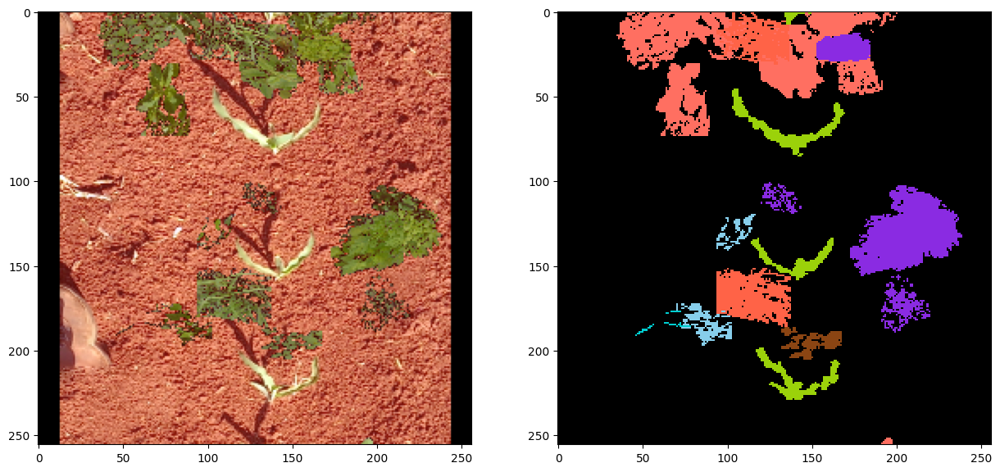

In [ ]:
for i in range(0, len(val_dataset), int(len(val_dataset)/5)):
    img, mask = val_dataset[i]
    _, axis = plt.subplots(1,2, figsize=(15,20))
    axis[0].imshow(img.permute(1,2,0))
    axis[1].imshow(mask, cmap=cmap, vmin=0, vmax=len(colors)-1, interpolation='nearest')

In [ ]:
class AvageraMeter(object):
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

def accuracy_function(preds, targets):
    preds_flat = preds.flatten()
    targets_flat = targets.flatten()
    acc = torch.sum(preds_flat == targets_flat)
    return acc/targets_flat.shape[0]


In [ ]:
from tqdm import tqdm as tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
ACTIVATION = None
MODE: str = 'multiclass'
LEARNING_RATE = 1e-4

criterion = smp.losses.FocalLoss(mode=MODE)

model = smp.Unet(
    encoder_name=ENCODER,
    encoder_weights=ENCODER_WEIGHTS,
    in_channels = 3,
    classes=len(CornWeedsDataset.CLASSES),
    activation=ACTIVATION
)

model.to(DEVICE)
num_classes = 16
iou_fn = MulticlassJaccardIndex(num_classes=num_classes, average=None).to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)

train_loss_meter = AvageraMeter()
val_loss_meter = AvageraMeter()
acc_meter = AvageraMeter()
iou_meter = AvageraMeter()
best_miou = 0

Downloading: "https://download.pytorch.org/models/resnet152-b121ed2d.pth" to /root/.cache/torch/hub/checkpoints/resnet152-b121ed2d.pth
100%|██████████| 230M/230M [00:01<00:00, 204MB/s]


In [ ]:
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F

for epoch in range(35):
    train_loss_meter.reset()
    val_loss_meter.reset()
    acc_meter.reset()

    for i, (inputs, labels) in enumerate(tqdm(train_data_loader)):
        optimizer.zero_grad()

        n = inputs.shape[1]
        inputs = inputs.to(DEVICE).float()
        labels = labels.to(DEVICE).float()

        outputs = model(inputs)
        labels = labels.squeeze()

        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        with torch.no_grad():
            active_output = outputs.sigmoid().round().long()
            active_output = active_output.argmax(dim=1)
            train_loss_meter.update(loss.item(), n)
            acc_meter.update(accuracy_function(active_output, labels.long()), n)
            iou_meter.update(iou_fn(active_output, labels), n)

    current_miou = iou_meter.avg.mean()
    print(f'epoch: {epoch}; loss: {train_loss_meter.avg}; accuracy: {acc_meter.avg};  miou: {current_miou}; iou: {iou_meter.avg}')

    if current_miou > best_miou:
        best_miou = current_miou
        print("saving model")
        torch.save(model.state_dict(), f'drive/My Drive/TCC/trained models/ce_unet_mixed_model.pth')


100%|██████████| 4435/4435 [55:41<00:00,  1.33it/s]


epoch: 0; loss: 0.16823162466808397; accuracy: 0.9253570437431335;  miou: 0.10565764456987381; iou: tensor([9.2545e-01, 6.1540e-01, 1.1439e-04, 5.3576e-05, 1.6124e-04, 3.3446e-02,
        1.8600e-04, 2.1023e-05, 5.6083e-04, 4.8510e-02, 1.7410e-05, 0.0000e+00,
        1.2866e-05, 1.0893e-04, 4.4060e-05, 6.6434e-02], device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:52<00:00,  9.39it/s]


epoch: 1; loss: 0.062410326308771344; accuracy: 0.948052704334259;  miou: 0.17825832962989807; iou: tensor([9.3693e-01, 6.8694e-01, 1.5868e-01, 1.2029e-02, 9.2732e-02, 2.2471e-01,
        1.0407e-01, 3.7644e-02, 1.4028e-01, 1.9882e-01, 2.0407e-02, 2.7903e-03,
        3.1270e-04, 4.7616e-03, 4.2775e-03, 2.2676e-01], device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:49<00:00,  9.44it/s]


epoch: 2; loss: 0.05106897603220641; accuracy: 0.9597271084785461;  miou: 0.2525816559791565; iou: tensor([0.9452, 0.7166, 0.2483, 0.0890, 0.1894, 0.3084, 0.2166, 0.1445, 0.2261,
        0.2865, 0.1152, 0.0457, 0.0403, 0.0753, 0.0739, 0.3202],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:50<00:00,  9.42it/s]


epoch: 3; loss: 0.046099585579895117; accuracy: 0.9645055532455444;  miou: 0.30463290214538574; iou: tensor([0.9507, 0.7339, 0.2993, 0.1369, 0.2494, 0.3522, 0.2893, 0.2093, 0.2816,
        0.3412, 0.1894, 0.0871, 0.1063, 0.1328, 0.1379, 0.3767],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:47<00:00,  9.49it/s]


epoch: 4; loss: 0.04273599141110428; accuracy: 0.9674986004829407;  miou: 0.3427610993385315; iou: tensor([0.9545, 0.7458, 0.3346, 0.1718, 0.2919, 0.3811, 0.3392, 0.2563, 0.3231,
        0.3809, 0.2436, 0.1223, 0.1597, 0.1764, 0.1857, 0.4174],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:32<00:00,  9.81it/s]


epoch: 5; loss: 0.04034309858643149; accuracy: 0.9697285890579224;  miou: 0.37264004349708557; iou: tensor([0.9573, 0.7546, 0.3617, 0.2042, 0.3251, 0.4049, 0.3757, 0.2938, 0.3559,
        0.4101, 0.2851, 0.1509, 0.2019, 0.2099, 0.2222, 0.4489],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:30<00:00,  9.84it/s]


epoch: 6; loss: 0.03817762116509938; accuracy: 0.9717350006103516;  miou: 0.3976646661758423; iou: tensor([0.9597, 0.7614, 0.3844, 0.2326, 0.3533, 0.4268, 0.4055, 0.3248, 0.3821,
        0.4344, 0.3192, 0.1750, 0.2372, 0.2384, 0.2532, 0.4745],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:27<00:00,  9.91it/s]


epoch: 7; loss: 0.03677234623702967; accuracy: 0.9729608297348022;  miou: 0.41823315620422363; iou: tensor([0.9616, 0.7669, 0.4032, 0.2553, 0.3776, 0.4462, 0.4301, 0.3495, 0.4031,
        0.4549, 0.3468, 0.1951, 0.2658, 0.2620, 0.2776, 0.4960],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:34<00:00,  9.76it/s]


epoch: 8; loss: 0.03529792677573314; accuracy: 0.9741122126579285;  miou: 0.43592149019241333; iou: tensor([0.9631, 0.7716, 0.4191, 0.2751, 0.3982, 0.4626, 0.4508, 0.3704, 0.4223,
        0.4727, 0.3700, 0.2122, 0.2896, 0.2831, 0.2987, 0.5152],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:33<00:00,  9.79it/s]


epoch: 9; loss: 0.03394040695130153; accuracy: 0.9752051830291748;  miou: 0.451317697763443; iou: tensor([0.9645, 0.7756, 0.4330, 0.2921, 0.4167, 0.4772, 0.4688, 0.3885, 0.4397,
        0.4872, 0.3894, 0.2283, 0.3094, 0.3012, 0.3179, 0.5316],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:32<00:00,  9.79it/s]


epoch: 10; loss: 0.03315326027370561; accuracy: 0.9758068323135376;  miou: 0.46484285593032837; iou: tensor([0.9657, 0.7792, 0.4454, 0.3070, 0.4325, 0.4904, 0.4841, 0.4038, 0.4548,
        0.5003, 0.4073, 0.2422, 0.3275, 0.3172, 0.3340, 0.5461],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:35<00:00,  9.73it/s]


epoch: 11; loss: 0.03209766794600878; accuracy: 0.9766076803207397;  miou: 0.4768383800983429; iou: tensor([0.9667, 0.7823, 0.4562, 0.3205, 0.4467, 0.5017, 0.4975, 0.4174, 0.4680,
        0.5125, 0.4227, 0.2552, 0.3430, 0.3312, 0.3490, 0.5587],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:30<00:00,  9.83it/s]


epoch: 12; loss: 0.03136534595078754; accuracy: 0.9771943092346191;  miou: 0.48767155408859253; iou: tensor([0.9676, 0.7851, 0.4660, 0.3320, 0.4602, 0.5131, 0.5097, 0.4294, 0.4796,
        0.5233, 0.4362, 0.2669, 0.3572, 0.3443, 0.3620, 0.5699],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:30<00:00,  9.85it/s]


epoch: 13; loss: 0.030688405191481718; accuracy: 0.9776508212089539;  miou: 0.49743086099624634; iou: tensor([0.9684, 0.7877, 0.4750, 0.3424, 0.4722, 0.5229, 0.5203, 0.4406, 0.4905,
        0.5329, 0.4484, 0.2775, 0.3698, 0.3561, 0.3739, 0.5801],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:26<00:00,  9.94it/s]


epoch: 14; loss: 0.029851017928479624; accuracy: 0.978272557258606;  miou: 0.506400465965271; iou: tensor([0.9692, 0.7900, 0.4833, 0.3518, 0.4832, 0.5312, 0.5306, 0.4503, 0.5011,
        0.5423, 0.4595, 0.2875, 0.3812, 0.3667, 0.3849, 0.5895],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:27<00:00,  9.92it/s]


epoch: 15; loss: 0.029407247862533962; accuracy: 0.9785923361778259;  miou: 0.5146037936210632; iou: tensor([0.9698, 0.7922, 0.4913, 0.3604, 0.4936, 0.5394, 0.5395, 0.4591, 0.5102,
        0.5501, 0.4703, 0.2968, 0.3914, 0.3765, 0.3947, 0.5981],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:29<00:00,  9.87it/s]


epoch: 16; loss: 0.02872803967714881; accuracy: 0.979041337966919;  miou: 0.5221425890922546; iou: tensor([0.9705, 0.7942, 0.4983, 0.3684, 0.5028, 0.5467, 0.5478, 0.4670, 0.5189,
        0.5574, 0.4798, 0.3056, 0.4012, 0.3858, 0.4038, 0.6061],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:30<00:00,  9.85it/s]


epoch: 17; loss: 0.028172133704216933; accuracy: 0.9794481992721558;  miou: 0.5291696786880493; iou: tensor([0.9710, 0.7961, 0.5049, 0.3758, 0.5114, 0.5535, 0.5554, 0.4748, 0.5268,
        0.5644, 0.4886, 0.3140, 0.4100, 0.3939, 0.4126, 0.6134],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:36<00:00,  9.72it/s]


epoch: 18; loss: 0.027573249223846796; accuracy: 0.9798603057861328;  miou: 0.5358193516731262; iou: tensor([0.9715, 0.7979, 0.5113, 0.3830, 0.5197, 0.5597, 0.5627, 0.4823, 0.5345,
        0.5713, 0.4966, 0.3216, 0.4182, 0.4019, 0.4204, 0.6204],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:32<00:00,  9.81it/s]


epoch: 19; loss: 0.027062968131923354; accuracy: 0.9801756739616394;  miou: 0.5419747829437256; iou: tensor([0.9720, 0.7995, 0.5171, 0.3897, 0.5270, 0.5655, 0.5691, 0.4892, 0.5416,
        0.5776, 0.5041, 0.3289, 0.4259, 0.4092, 0.4282, 0.6268],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:31<00:00,  9.81it/s]


epoch: 20; loss: 0.026591657910794188; accuracy: 0.9805264472961426;  miou: 0.5478577613830566; iou: tensor([0.9725, 0.8011, 0.5229, 0.3960, 0.5342, 0.5710, 0.5752, 0.4956, 0.5483,
        0.5838, 0.5114, 0.3361, 0.4330, 0.4164, 0.4355, 0.6329],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:35<00:00,  9.74it/s]


epoch: 21; loss: 0.02629304993813679; accuracy: 0.9807541966438293;  miou: 0.5533112287521362; iou: tensor([0.9729, 0.8026, 0.5281, 0.4019, 0.5406, 0.5762, 0.5809, 0.5016, 0.5545,
        0.5894, 0.5181, 0.3428, 0.4396, 0.4229, 0.4424, 0.6384],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:33<00:00,  9.77it/s]


epoch: 22; loss: 0.02579246398372305; accuracy: 0.98105388879776;  miou: 0.5585330724716187; iou: tensor([0.9733, 0.8040, 0.5331, 0.4075, 0.5470, 0.5813, 0.5861, 0.5074, 0.5604,
        0.5947, 0.5245, 0.3494, 0.4461, 0.4291, 0.4486, 0.6440],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:33<00:00,  9.79it/s]


epoch: 23; loss: 0.02549324208700435; accuracy: 0.9812856316566467;  miou: 0.5634006261825562; iou: tensor([0.9736, 0.8054, 0.5376, 0.4124, 0.5529, 0.5859, 0.5911, 0.5128, 0.5658,
        0.5996, 0.5304, 0.3556, 0.4524, 0.4352, 0.4547, 0.6491],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:32<00:00,  9.80it/s]


epoch: 24; loss: 0.025016672880700638; accuracy: 0.9815746545791626;  miou: 0.5681326389312744; iou: tensor([0.9740, 0.8066, 0.5421, 0.4176, 0.5587, 0.5904, 0.5961, 0.5180, 0.5711,
        0.6043, 0.5359, 0.3615, 0.4585, 0.4409, 0.4607, 0.6537],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:31<00:00,  9.81it/s]


epoch: 25; loss: 0.024569577767420244; accuracy: 0.9818658232688904;  miou: 0.5726121664047241; iou: tensor([0.9743, 0.8079, 0.5461, 0.4224, 0.5643, 0.5946, 0.6010, 0.5229, 0.5761,
        0.6090, 0.5412, 0.3669, 0.4642, 0.4465, 0.4661, 0.6586],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:28<00:00,  9.90it/s]


epoch: 26; loss: 0.02440184514503401; accuracy: 0.9819830060005188;  miou: 0.5768839120864868; iou: tensor([0.9746, 0.8091, 0.5499, 0.4268, 0.5697, 0.5985, 0.6057, 0.5275, 0.5808,
        0.6135, 0.5463, 0.3723, 0.4694, 0.4518, 0.4716, 0.6629],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:29<00:00,  9.86it/s]


epoch: 27; loss: 0.02409878318946653; accuracy: 0.9822352528572083;  miou: 0.5809513330459595; iou: tensor([0.9749, 0.8102, 0.5535, 0.4312, 0.5745, 0.6025, 0.6102, 0.5319, 0.5853,
        0.6177, 0.5511, 0.3772, 0.4745, 0.4568, 0.4766, 0.6672],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:28<00:00,  9.88it/s]


epoch: 28; loss: 0.023941097510380097; accuracy: 0.9823291301727295;  miou: 0.5847607851028442; iou: tensor([0.9752, 0.8113, 0.5570, 0.4354, 0.5790, 0.6063, 0.6141, 0.5360, 0.5894,
        0.6217, 0.5557, 0.3820, 0.4791, 0.4615, 0.4813, 0.6711],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:29<00:00,  9.87it/s]


epoch: 29; loss: 0.023550505570966537; accuracy: 0.9825970530509949;  miou: 0.5884122848510742; iou: tensor([0.9755, 0.8124, 0.5602, 0.4394, 0.5835, 0.6098, 0.6180, 0.5401, 0.5936,
        0.6256, 0.5600, 0.3868, 0.4835, 0.4661, 0.4857, 0.6745],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:27<00:00,  9.90it/s]


epoch: 30; loss: 0.023377792834143627; accuracy: 0.9827046990394592;  miou: 0.5919123888015747; iou: tensor([0.9757, 0.8134, 0.5634, 0.4433, 0.5877, 0.6129, 0.6215, 0.5440, 0.5976,
        0.6292, 0.5641, 0.3914, 0.4878, 0.4705, 0.4899, 0.6781],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:32<00:00,  9.80it/s]


epoch: 31; loss: 0.02305705802223258; accuracy: 0.9828571081161499;  miou: 0.5952451229095459; iou: tensor([0.9760, 0.8144, 0.5665, 0.4468, 0.5919, 0.6161, 0.6248, 0.5477, 0.6013,
        0.6326, 0.5682, 0.3956, 0.4921, 0.4748, 0.4939, 0.6815],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:34<00:00,  9.75it/s]


epoch: 32; loss: 0.02275122604747602; accuracy: 0.9831221103668213;  miou: 0.5985063314437866; iou: tensor([0.9762, 0.8153, 0.5695, 0.4504, 0.5958, 0.6192, 0.6281, 0.5512, 0.6049,
        0.6359, 0.5720, 0.3998, 0.4960, 0.4791, 0.4979, 0.6848],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:31<00:00,  9.81it/s]


epoch: 33; loss: 0.022687826988107725; accuracy: 0.9831437468528748;  miou: 0.6015927791595459; iou: tensor([0.9764, 0.8163, 0.5723, 0.4538, 0.5995, 0.6221, 0.6312, 0.5548, 0.6083,
        0.6391, 0.5756, 0.4037, 0.4996, 0.4831, 0.5016, 0.6879],
       device='cuda:0')
saving model


100%|██████████| 4435/4435 [07:34<00:00,  9.75it/s]


epoch: 34; loss: 0.022293837914472234; accuracy: 0.9833998680114746;  miou: 0.6045678853988647; iou: tensor([0.9767, 0.8172, 0.5751, 0.4570, 0.6032, 0.6248, 0.6342, 0.5579, 0.6116,
        0.6422, 0.5792, 0.4077, 0.5034, 0.4870, 0.5052, 0.6907],
       device='cuda:0')
saving model
